For more information for each command, please refer to notebook in Estrus dataset

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as pltc
import glob
import bbknn
from pandas.core.index import RangeIndex
from matplotlib import rcParams

/opt/conda/envs/hub_v2/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  import sys


In [2]:
sc.settings.verbosity = 3  
sc.logging.print_header() 
sc.settings.set_figure_params(dpi=80) 

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.3 pandas==1.1.4 scikit-learn==0.23.2 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.2


In [3]:
VE24AmIs_subset = sc.read('./VE24AmIs_subset.h5ad') 

In [5]:
sc.tl.pca(VE24AmIs_subset, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:11)


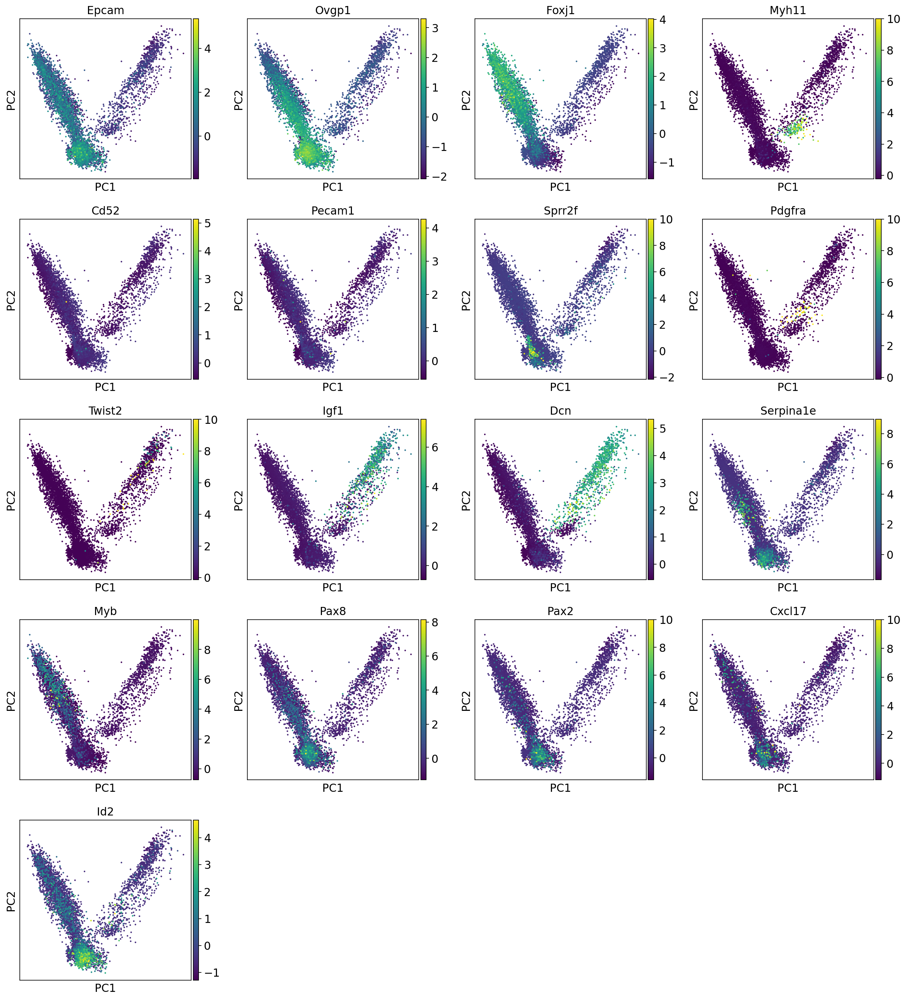

In [6]:
sc.pl.pca(VE24AmIs_subset,
          color=['Epcam', 'Ovgp1', 'Foxj1', 'Myh11', 'Cd52', 'Pecam1', 'Sprr2f',
                  
                  'Pdgfra', 'Twist2', 'Igf1', 'Dcn', 'Serpina1e', 'Myb', 'Pax8', 'Pax2', 'Cxcl17', 'Id2'])

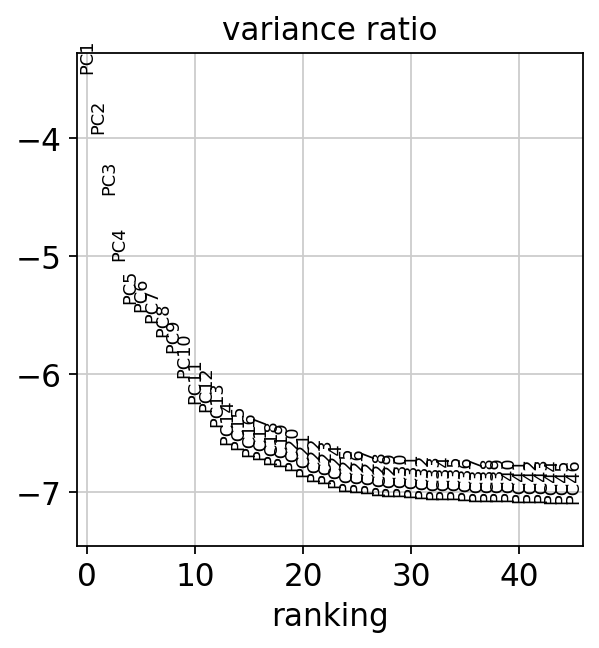

In [7]:
sc.pl.pca_variance_ratio(VE24AmIs_subset, n_pcs=45, log=True)

In [8]:
sc.pp.neighbors(VE24AmIs_subset, n_neighbors=10, n_pcs=37)

computing neighbors
    using 'X_pca' with n_pcs = 37
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


In [9]:
sc.tl.umap(VE24AmIs_subset)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


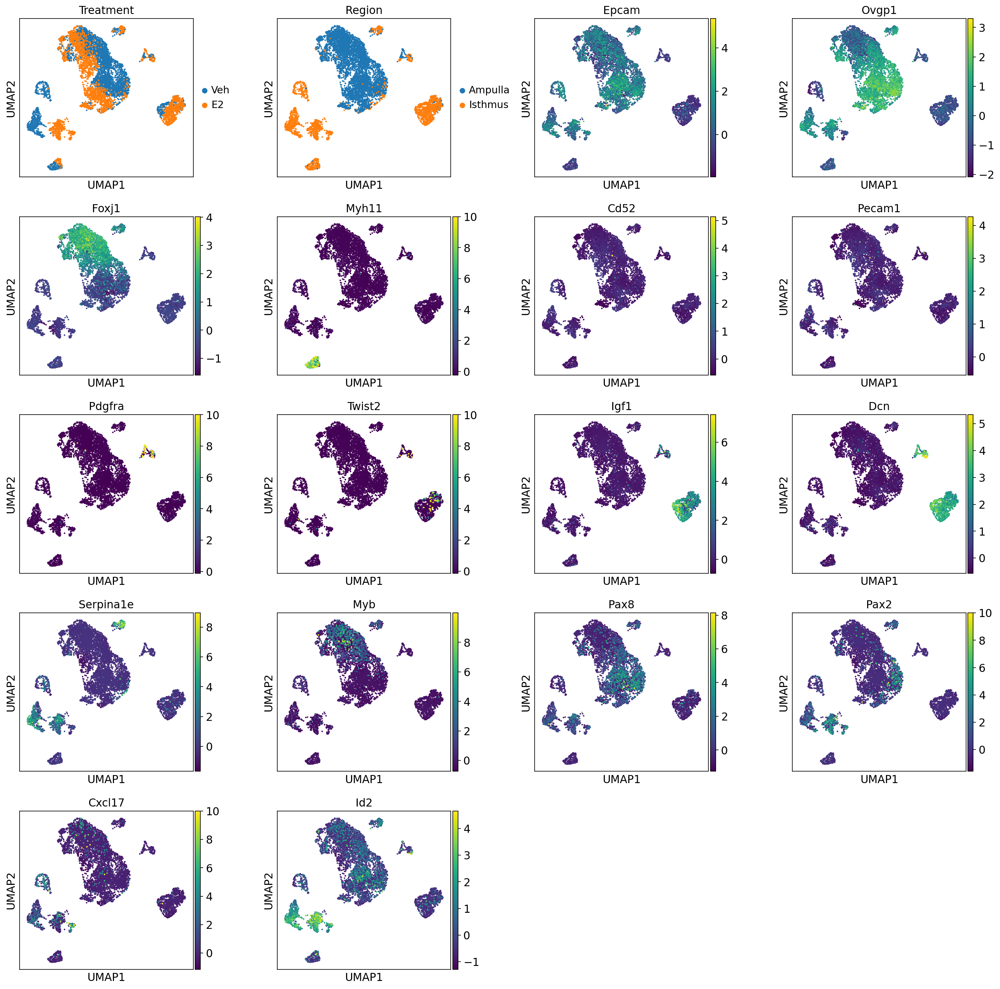

In [10]:
sc.pl.umap(VE24AmIs_subset, wspace=0.35,
           color=['Treatment', 'Region', 'Epcam', 'Ovgp1', 'Foxj1', 'Myh11', 'Cd52', 'Pecam1',
                  
                  'Pdgfra', 'Twist2', 'Igf1', 'Dcn', 'Serpina1e', 'Myb', 'Pax8', 'Pax2', 'Cxcl17', 'Id2'])

In [11]:
sc.tl.leiden(VE24AmIs_subset, resolution=0.06)

running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


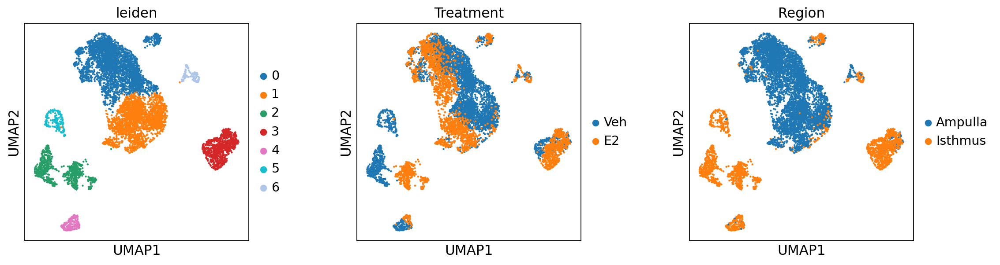

In [12]:
sc.pl.umap(VE24AmIs_subset, wspace=0.35, 
           color=['leiden', 'Treatment', 'Region'])

Saving once more before bbknn

In [13]:
VE24AmIs_subset.write('./VE24AmIs_subset.h5ad')

[Bbknn](https://github.com/Teichlab/bbknn) is for correcting for batch effect exhibited during merging data files. ****Only run once!**** Need to think about why you would want to correct either "Region" or "Time" - because you can run only once.
* 'batch_key' is the observation for which to exhibit the batch correction.
* 'copy' is set to true to create a new Merged_subset called 'Merged_subset_batchcorrected'.

In [14]:
VE24AmIs_subset_batchcorrected = bbknn.bbknn(VE24AmIs_subset, batch_key='Region', copy=True)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


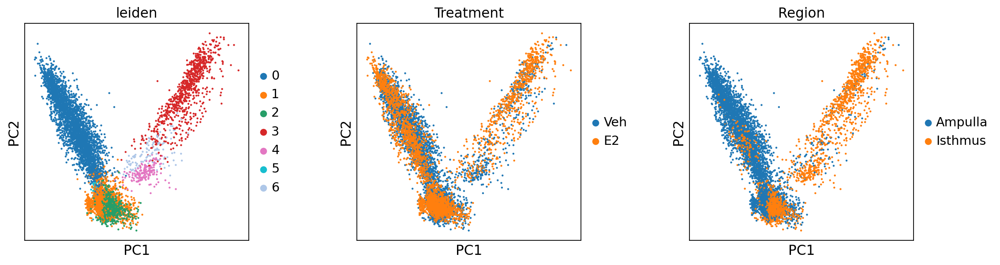

In [15]:
sc.pl.pca(VE24AmIs_subset_batchcorrected, wspace=0.35,
          color=['leiden', 'Treatment', 'Region'])

In [16]:
sc.tl.umap(VE24AmIs_subset_batchcorrected)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


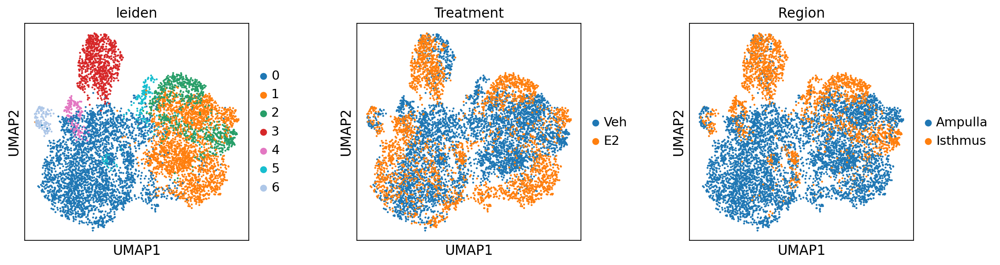

In [17]:
sc.pl.umap(VE24AmIs_subset_batchcorrected, wspace=0.35, 
           color=['leiden', 'Treatment', 'Region'])

In [18]:
marker_genes = ['Epcam', 'Krt8','Krt19','Vim','Pdgfra','Twist2', 'Sprr2f',
                'Acta2', 'Myh11','Foxj1', 'Ccdc153', 'Ovgp1','Wt1','Serpina1e','S100g','Pecam1',
                 ]

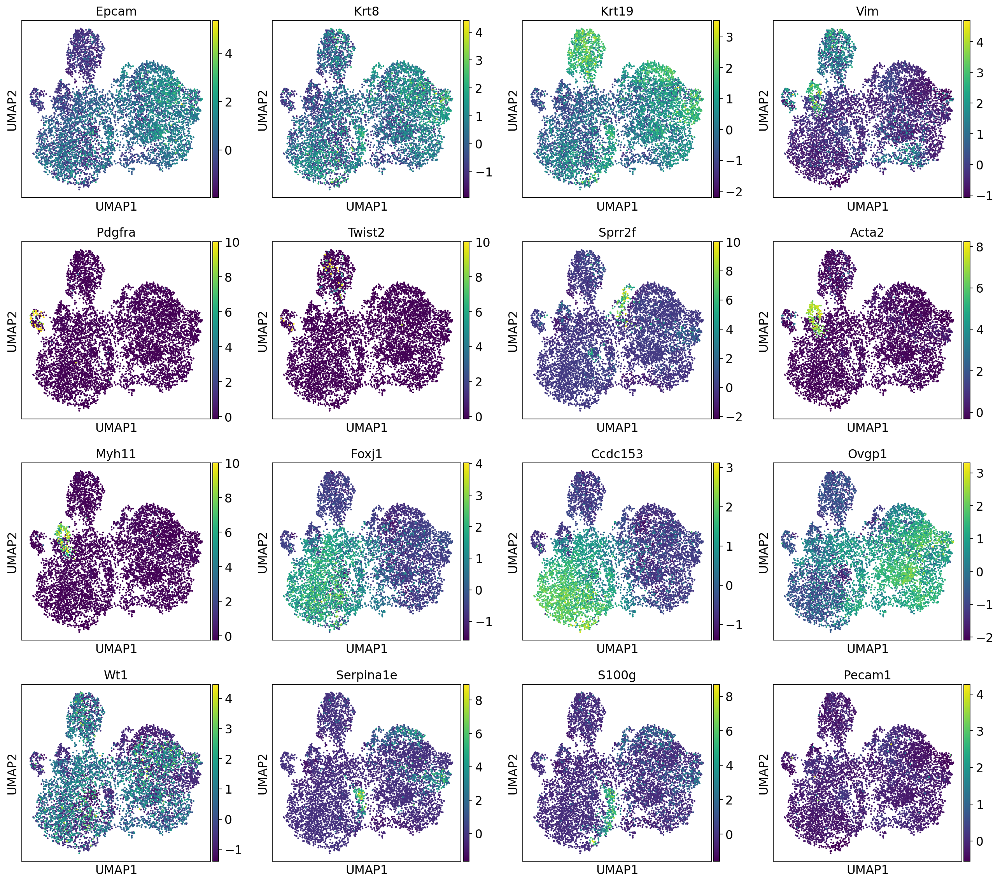

In [19]:
sc.pl.umap(VE24AmIs_subset_batchcorrected, color=marker_genes)

In [20]:
VE24AmIs_subset_batchcorrected.obs.groupby(["leiden","Treatment","Region"]).apply(len)

leiden  Treatment  Region 
0       Veh        Ampulla    2036
                   Isthmus      49
        E2         Ampulla    1002
                   Isthmus      72
1       Veh        Ampulla    1501
                   Isthmus      59
        E2         Ampulla     720
                   Isthmus      31
2       Veh        Ampulla       1
                   Isthmus     432
        E2         Isthmus     418
3       Veh        Ampulla      81
                   Isthmus     175
        E2         Ampulla       8
                   Isthmus     561
4       Veh        Ampulla       7
                   Isthmus     125
        E2         Ampulla       3
                   Isthmus      39
5       Veh        Isthmus     170
        E2         Ampulla       2
6       Veh        Ampulla      28
                   Isthmus      32
        E2         Ampulla      29
                   Isthmus      31
dtype: int64

In [21]:
new_cluster_names = [
    '0 Ciliated_InfAmp',
    '1 Secretory_InfAmp',
    '2 Secretory_IsthUTJ',
    '3 Fibroblast Pdgfra-',
    '4 Muscle',
    '5 Epithelial_subset',
    '6 Fibroblast Pdgfra+'
]
VE24AmIs_subset_batchcorrected.rename_categories('leiden', new_cluster_names)

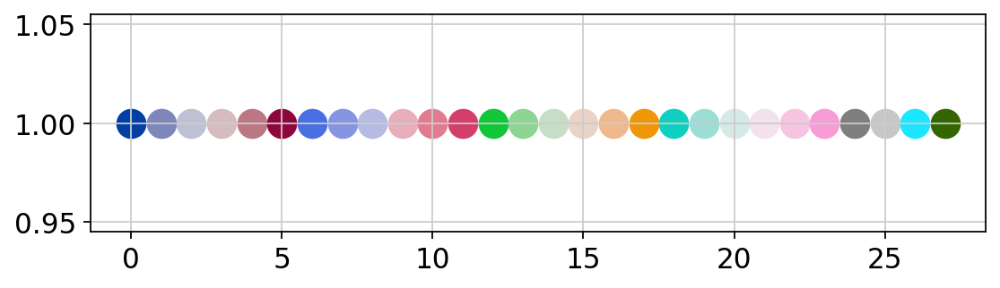

In [22]:
pltc.figure(figsize=(8, 2))
for i in range(28):
    pltc.scatter(i, 1, c=sc.pl.palettes.zeileis_28[i], s=200)
pltc.show()

In [23]:
zeileis_colors = np.array(sc.pl.palettes.zeileis_28)
new_colors = np.array(VE24AmIs_subset_batchcorrected.uns['leiden_colors'])

In [24]:
new_colors[[0]] = zeileis_colors[[23]]  #0 Ciliated_InfAmp
new_colors[[1]] = zeileis_colors[[6]]  #1 Secretory_InfAmp
new_colors[[2]] = zeileis_colors[[13]]  #2 Secretory_IsthUTJ
new_colors[[3]] = zeileis_colors[[17]]  #3 Fibroblast Pdgfra-
new_colors[[4]] = zeileis_colors[[24]]  #4 Muscle
new_colors[[5]] = zeileis_colors[[5]]  #5 Epithelial_subset
new_colors[[6]] = zeileis_colors[[16]]  #6 Fibroblast Pdgfra+

In [25]:
VE24AmIs_subset_batchcorrected.uns['leiden_colors'] = new_colors

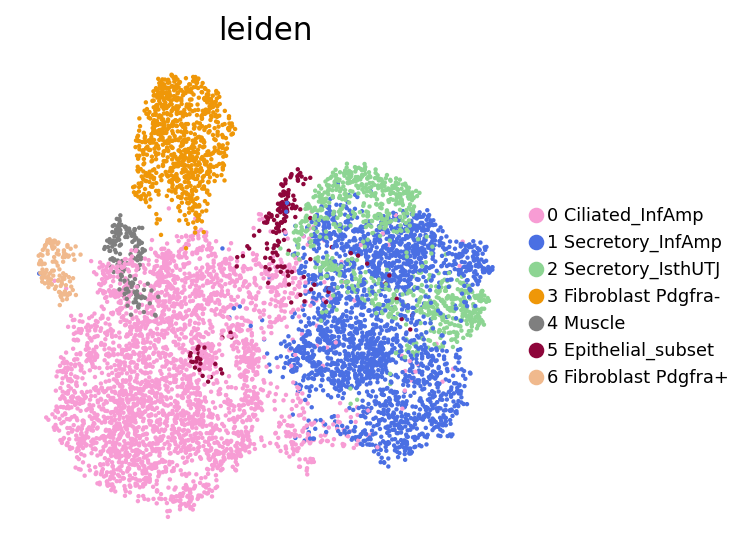

In [26]:
sc.pl.umap(VE24AmIs_subset_batchcorrected, color='leiden', legend_loc='right margin', legend_fontsize='8.0',
           frameon=False,
          save='_Fig 2A.pdf')

In [27]:
new_cluster_names = [
    '0 Veh',
    '1 E2'
]
VE24AmIs_subset_batchcorrected.rename_categories('Treatment', new_cluster_names)

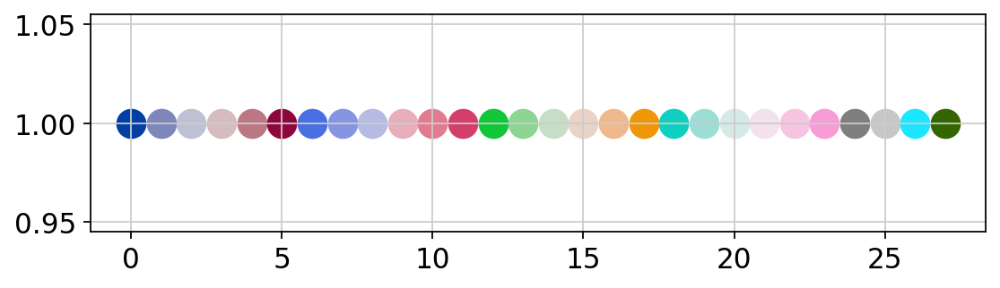

In [28]:
pltc.figure(figsize=(8, 2))
for i in range(28):
    pltc.scatter(i, 1, c=sc.pl.palettes.zeileis_28[i], s=200)
pltc.show()

In [29]:
zeileis_colors = np.array(sc.pl.palettes.zeileis_28)
new_colors = np.array(VE24AmIs_subset_batchcorrected.uns['Treatment_colors'])

In [30]:
new_colors[[0]] = zeileis_colors[[6]]  #0 Veh
new_colors[[1]] = zeileis_colors[[11]]  #1 E2

In [31]:
VE24AmIs_subset_batchcorrected.uns['Treatment_colors'] = new_colors

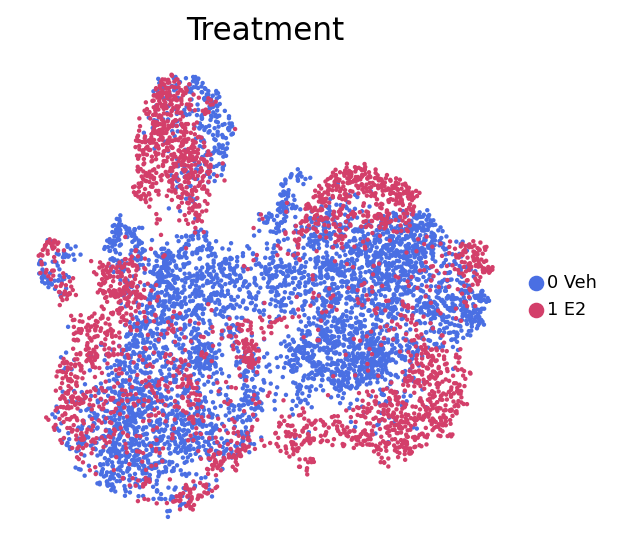

In [32]:
sc.pl.umap(VE24AmIs_subset_batchcorrected, color='Treatment', legend_loc='right margin', legend_fontsize='8.0',
           frameon=False,
            save='_Fig 2D.pdf')

In [33]:
new_cluster_names = [
    '0 Ampulla',
    '1 Isthmus'
]
VE24AmIs_subset_batchcorrected.rename_categories('Region', new_cluster_names)

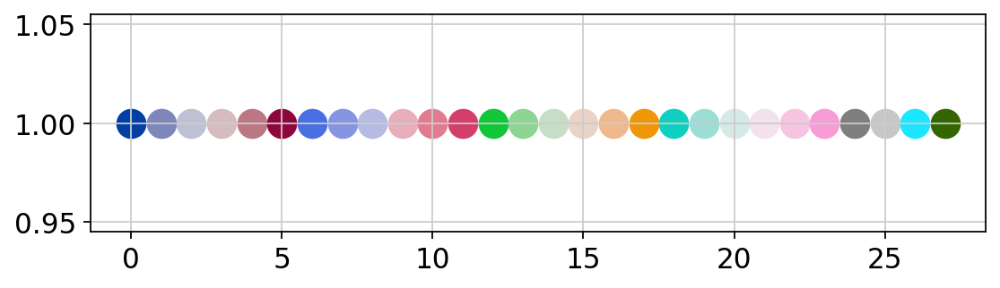

In [34]:
pltc.figure(figsize=(8, 2))
for i in range(28):
    pltc.scatter(i, 1, c=sc.pl.palettes.zeileis_28[i], s=200)
pltc.show()

In [35]:
zeileis_colors = np.array(sc.pl.palettes.zeileis_28)
new_colors = np.array(VE24AmIs_subset_batchcorrected.uns['Region_colors'])

In [36]:
new_colors[[0]] = zeileis_colors[[9]]  #0 Ampulla
new_colors[[1]] = zeileis_colors[[0]]  #1 Isthmus

In [37]:
VE24AmIs_subset_batchcorrected.uns['Region_colors'] = new_colors

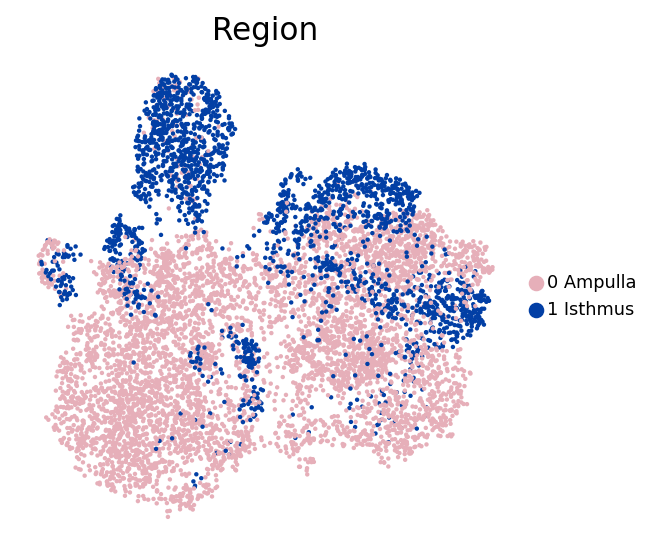

In [38]:
sc.pl.umap(VE24AmIs_subset_batchcorrected, color='Region', legend_loc='right margin', legend_fontsize='8.0',
           frameon=False,
          save='_Fig 2C.pdf')

In [39]:
VE24AmIs_subset_batchcorrected.write('./VE24AmIs_subset_batchcorrected.h5ad')